<a href="https://colab.research.google.com/github/iChetanRaval/ApiTrailData/blob/main/OCR_Modelipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Cell 1: Install Dependencies (Run once)
!pip install keras tensorflow mltu tqdm opencv-python-headless onnx onnxruntime

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.6/74.6 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 47.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 67.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 88.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.1/69.1 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 385.8/385.8 kB 34.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.5/133.5 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 53.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 6.5 MB/s eta 0:00:00
  Created wheel

In [ ]:
# Cell 2: Import Dependencies
import tensorflow as tf
from keras import layers
from keras.models import Model
import os
import tarfile
from tqdm import tqdm
from urllib.request import urlopen
from io import BytesIO
from zipfile import ZipFile

from mltu.preprocessors import ImageReader
from mltu.transformers import ImageResizer, LabelIndexer, LabelPadding
from mltu.augmentors import RandomBrightness, RandomRotate, RandomErodeDilate, RandomSharpen
from mltu.annotations.images import CVImage
from mltu.tensorflow.dataProvider import DataProvider
from mltu.tensorflow.losses import CTCloss
from mltu.tensorflow.callbacks import Model2onnx, TrainLogger
from mltu.tensorflow.metrics import CWERMetric

In [ ]:
# Cell 3: Download IAM Dataset
def download_and_unzip(url, extract_to="Datasets", chunk_size=1024*1024):
    http_response = urlopen(url)
    data = b""
    iterations = http_response.length // chunk_size + 1
    for _ in tqdm(range(iterations)):
        data += http_response.read(chunk_size)
    zipfile = ZipFile(BytesIO(data))
    zipfile.extractall(path=extract_to)

dataset_path = os.path.join("Datasets", "IAM_Words")
if not os.path.exists(dataset_path):
    download_and_unzip("https://git.io/J0fjL", extract_to="Datasets")
    file = tarfile.open(os.path.join(dataset_path, "words.tgz"))
    file.extractall(os.path.join(dataset_path, "words"))

100%|██████████| 784/784 [04:15<00:00,  3.07it/s]


In [ ]:
# Cell 4: Load Dataset
dataset, vocab, max_len = [], set(), 0
words = open(os.path.join(dataset_path, "words.txt"), "r").readlines()
for line in tqdm(words):
    if line.startswith("#"): continue
    line_split = line.split(" ")
    if line_split[1] == "err": continue
    folder1 = line_split[0][:3]
    folder2 = "-".join(line_split[0].split("-")[:2])
    file_name = line_split[0] + ".png"
    label = line_split[-1].rstrip("\n")
    rel_path = os.path.join(dataset_path, "words", folder1, folder2, file_name)
    if not os.path.exists(rel_path): continue
    dataset.append([rel_path, label])
    vocab.update(list(label))
    max_len = max(max_len, len(label))

100%|██████████| 115338/115338 [00:00<00:00, 119237.26it/s]


In [ ]:
# Cell: Define residual block
def residual_block(x, filters, kernel_size=(3, 3), strides=1, activation="leaky_relu", skip_conv=False, dropout=0.2):
    y = layers.Conv2D(filters, kernel_size=kernel_size, strides=strides, padding="same")(x)
    y = layers.BatchNormalization()(y)
    y = layers.Activation(activation)(y)
    y = layers.Conv2D(filters, kernel_size=kernel_size, strides=1, padding="same")(y)
    y = layers.BatchNormalization()(y)

    if skip_conv:
        x = layers.Conv2D(filters, kernel_size=(1, 1), strides=strides, padding="same")(x)

    out = layers.Add()([x, y])
    out = layers.Activation(activation)(out)
    out = layers.Dropout(dropout)(out)

    return out


In [ ]:
# Cell 5: Define Model
def train_model(input_dim, output_dim, activation="leaky_relu", dropout=0.2):
    inputs = layers.Input(shape=input_dim, name="input")
    input = layers.Lambda(lambda x: x / 255)(inputs)
    x1 = residual_block(input, 16, activation=activation, skip_conv=True, strides=1, dropout=dropout)
    x2 = residual_block(x1, 16, activation=activation, skip_conv=True, strides=2, dropout=dropout)
    x3 = residual_block(x2, 16, activation=activation, skip_conv=False, strides=1, dropout=dropout)
    x4 = residual_block(x3, 32, activation=activation, skip_conv=True, strides=2, dropout=dropout)
    x5 = residual_block(x4, 32, activation=activation, skip_conv=False, strides=1, dropout=dropout)
    x6 = residual_block(x5, 64, activation=activation, skip_conv=True, strides=2, dropout=dropout)
    x7 = residual_block(x6, 64, activation=activation, skip_conv=True, strides=1, dropout=dropout)
    x8 = residual_block(x7, 64, activation=activation, skip_conv=False, strides=1, dropout=dropout)
    x9 = residual_block(x8, 64, activation=activation, skip_conv=False, strides=1, dropout=dropout)
    squeezed = layers.Reshape((x9.shape[-3] * x9.shape[-2], x9.shape[-1]))(x9)
    blstm = layers.Bidirectional(layers.LSTM(128, return_sequences=True))(squeezed)
    blstm = layers.Dropout(dropout)(blstm)
    output = layers.Dense(output_dim + 1, activation="softmax", name="output")(blstm)
    model = Model(inputs=inputs, outputs=output)
    return model

In [36]:
# Cell 6: Configure Training Parameters
class ModelConfigs:
    height = 32
    width = 128
    batch_size = 64
    learning_rate = 0.001
    train_epochs = 5
    train_workers = 4
    model_path = "trained_model"
    vocab = "".join(vocab)
    max_text_length = max_len

configs = ModelConfigs()

In [ ]:
# Cell 7: Data Preprocessing & Augmentation
data_provider = DataProvider(
    dataset=dataset, skip_validation=True, batch_size=configs.batch_size,
    data_preprocessors=[ImageReader(CVImage)],
    transformers=[
        ImageResizer(configs.width, configs.height, keep_aspect_ratio=False),
        LabelIndexer(configs.vocab),
        LabelPadding(max_word_length=configs.max_text_length, padding_value=len(configs.vocab)),
    ],
)
train_data_provider, val_data_provider = data_provider.split(split=0.9)
train_data_provider.augmentors = [RandomBrightness(), RandomErodeDilate(), RandomSharpen(), RandomRotate(angle=10)]

INFO:DataProvider:Skipping Dataset validation...


In [ ]:
# Cell 8: Initialize Model
model = train_model(input_dim=(configs.height, configs.width, 3), output_dim=len(configs.vocab))
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=configs.learning_rate),
    loss=CTCloss(),
    metrics=[CWERMetric(padding_token=len(configs.vocab))],
)
model.summary(line_length=110)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                   ┃ Output Shape              ┃          Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input (InputLayer)             │ (None, 32, 128, 3)        │                0 │ -                          │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ lambda (Lambda)                │ (None, 32, 128, 3)        │                0 │ input[0][0]                │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ conv2d (Conv2D)                │ (None, 32, 128, 16)       │              448 │ lambda[0][0]               │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ batch_normalization            │ (None, 32, 128, 16)       │               64 │ conv2d[0][0]               │
│ (BatchNormalization)           │                           │                  │                            │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ activation (Activation)        │ (None, 32, 128, 16)       │                0 │ batch_normalization[0][0]  │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ conv2d_1 (Conv2D)              │ (None, 32, 128, 16)       │            2,320 │ activation[0][0]           │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ conv2d_2 (Conv2D)              │ (None, 32, 128, 16)       │               64 │ lambda[0][0]               │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ batch_normalization_1          │ (None, 32, 128, 16)       │               64 │ conv2d_1[0][0]             │
│ (BatchNormalization)           │                           │                  │                            │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ add (Add)                      │ (None, 32, 128, 16)       │                0 │ conv2d_2[0][0],            │
│                                │                           │                  │ batch_normalization_1[0][… │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ activation_1 (Activation)      │ (None, 32, 128, 16)       │                0 │ add[0][0]                  │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ dropout (Dropout)              │ (None, 32, 128, 16)       │                0 │ activation_1[0][0]         │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ conv2d_3 (Conv2D)              │ (None, 16, 64, 16)        │            2,320 │ dropout[0][0]              │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ batch_normalization_2          │ (None, 16, 64, 16)        │               64 │ conv2d_3[0][0]             │
│ (BatchNormalization)           │                           │                  │                            │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ activation_2 (Activation)      │ (None, 16, 64, 16)        │                0 │ batch_normalization_2[0][… │
├────────────────────────────────┼───────────────────────────┼──────────────────┼────────────────────────────┤
│ conv2d_4 (Conv2D)              │ (None, 16, 64, 16)        │            2,320 │ activation_2[0][0]         │
├───

 Total params: 549,455 (2.10 MB)

 Trainable params: 547,983 (2.09 MB)

 Non-trainable params: 1,472 (5.75 KB)

In [ ]:
!pip install tf2onnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.8/455.8 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.1/162.1 kB 16.5 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.4
    Uninstalling protobuf-5.29.4:
      Successfully uninstalled protobuf-5.29.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.71.0 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 3.20.3 which is incompatible.
tensorflow-metadata 1.16.1 requires protobuf<6.0.0dev,>=4.25.2; python_version >= "3.11", but you have protobuf 3.20.3 which is incompatible.


In [ ]:
# Cell 9: Training Callbacks
# Updated EarlyStopping with mode="min"
from tensorflow.keras.callbacks import EarlyStopping
earlystopper = EarlyStopping(monitor="val_CER", patience=20, verbose=1, mode="min")
checkpoint = tf.keras.callbacks.ModelCheckpoint(f"{configs.model_path}/model.h5", monitor="val_CER", verbose=1, save_best_only=True, mode="min")
trainLogger = TrainLogger(configs.model_path)
tb_callback = tf.keras.callbacks.TensorBoard(f"{configs.model_path}/logs", update_freq=1)
reduceLROnPlat = tf.keras.callbacks.ReduceLROnPlateau(monitor="val_CER", factor=0.9, patience=10, verbose=1, mode="auto")
model2onnx = Model2onnx(f"{configs.model_path}/model.h5")

In [ ]:
# Corrected block (no TypeError)
model.fit(
    train_data_provider,
    validation_data=val_data_provider,
    epochs=configs.train_epochs,
    callbacks=[earlystopper, checkpoint, trainLogger, reduceLROnPlat, tb_callback, model2onnx]
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
1357/1357 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - CER: 1.1026 - WER: 0.9790 - loss: 18.1478
Epoch 1: val_CER improved from inf to 0.84081, saving model to trained_model/model.h5
1357/1357 ━━━━━━━━━━━━━━━━━━━━ 2358s 2s/step - CER: 1.1024 - WER: 0.9790 - loss: 18.1441 - val_CER: 0.8408 - val_WER: 0.9220 - val_loss: 10.0077 - learning_rate: 0.0010
Epoch 2/5
 714/1357 ━━━━━━━━━━━━━━━━━━━━ 18:39 2s/step - CER: 0.7969 - WER: 0.9011 - loss: 9.6930

In [ ]:
# Cell 11: Save Training Data
train_data_provider.to_csv(os.path.join(configs.model_path, "train.csv"))
val_data_provider.to_csv(os.path.join(configs.model_path, "val.csv"))

  0%|          | 0/9646 [00:00<?, ?it/s]

Image: Datasets/IAM_Words/words/c04/c04-160/c04-160-06-07.png, Label: to, Prediction: to, CER: 0.0


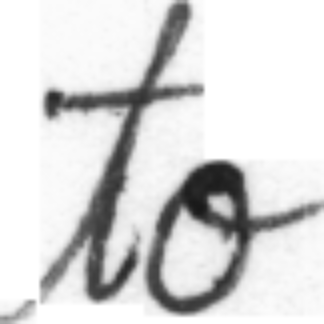

Image: Datasets/IAM_Words/words/n02/n02-120/n02-120-06-00.png, Label: But, Prediction: Wht, CER: 0.6666666666666666


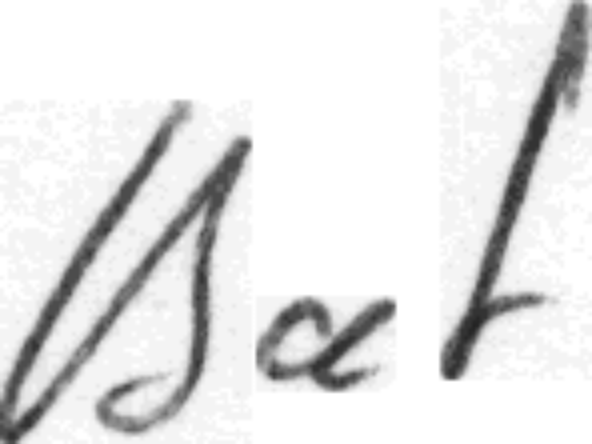

Image: Datasets/IAM_Words/words/m01/m01-115/m01-115-03-06.png, Label: to, Prediction: no, CER: 0.5


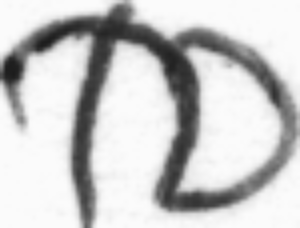

Image: Datasets/IAM_Words/words/h07/h07-071a/h07-071a-04-01.png, Label: of, Prediction: of, CER: 0.0


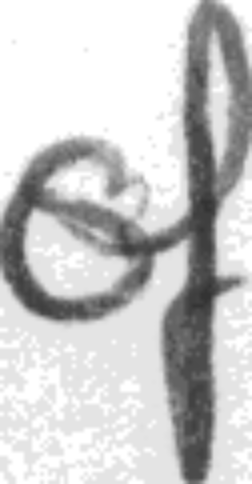

Image: Datasets/IAM_Words/words/c02/c02-082/c02-082-03-03.png, Label: ,, Prediction: ,, CER: 0.0


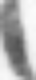

Image: Datasets/IAM_Words/words/a06/a06-090/a06-090-05-05.png, Label: Mr., Prediction: Mr., CER: 0.0


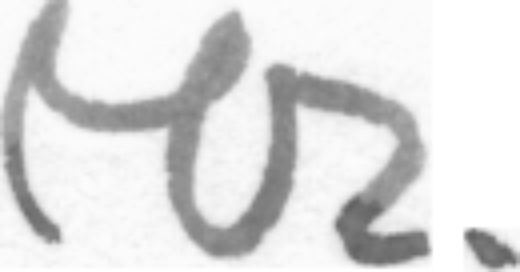

  0%|          | 6/9646 [00:00<03:16, 49.08it/s]

Image: Datasets/IAM_Words/words/a01/a01-030x/a01-030x-01-00.png, Label: ration, Prediction: ration, CER: 0.0


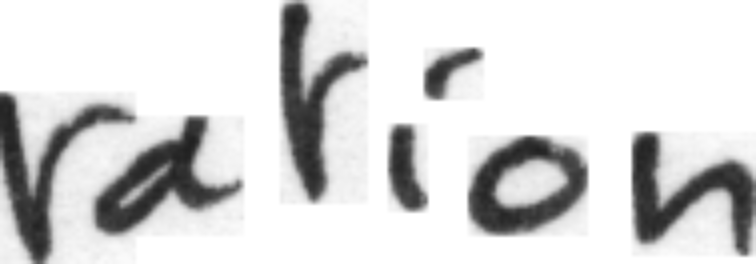

Image: Datasets/IAM_Words/words/d06/d06-091/d06-091-06-06.png, Label: day, Prediction: day, CER: 0.0


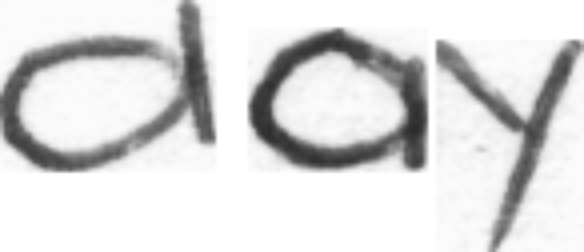

Image: Datasets/IAM_Words/words/f07/f07-021b/f07-021b-05-03.png, Label: have, Prediction: have, CER: 0.0


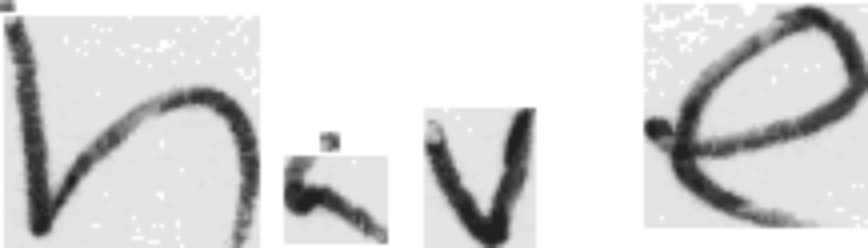

Image: Datasets/IAM_Words/words/a01/a01-026x/a01-026x-03-01.png, Label: ., Prediction: ,, CER: 1.0


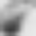

Image: Datasets/IAM_Words/words/a06/a06-014/a06-014-05-08.png, Label: only, Prediction: onby, CER: 0.25


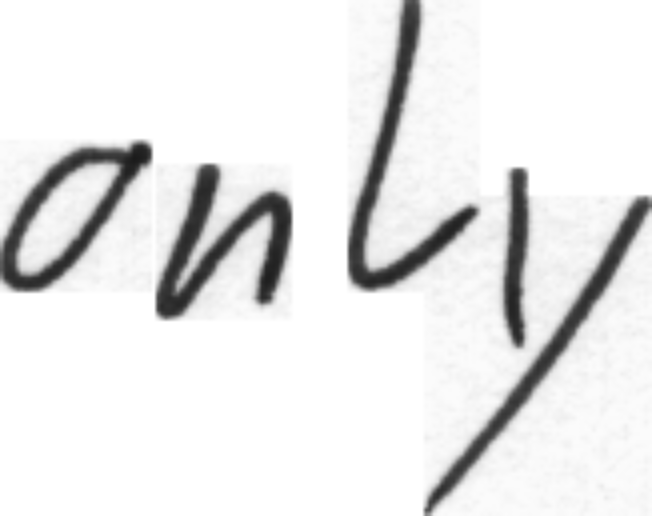

  0%|          | 11/9646 [00:00<03:38, 44.19it/s]

Image: Datasets/IAM_Words/words/k04/k04-017/k04-017-08-08.png, Label: no, Prediction: no, CER: 0.0


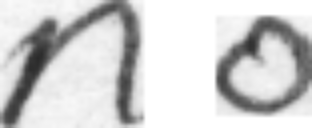

Image: Datasets/IAM_Words/words/l04/l04-113/l04-113-04-06.png, Label: lot, Prediction: lot, CER: 0.0


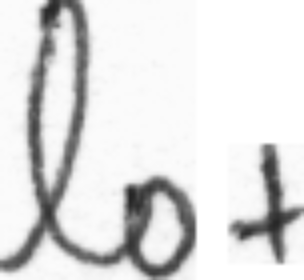

Image: Datasets/IAM_Words/words/m01/m01-100/m01-100-01-03.png, Label: saw, Prediction: gaw, CER: 0.3333333333333333


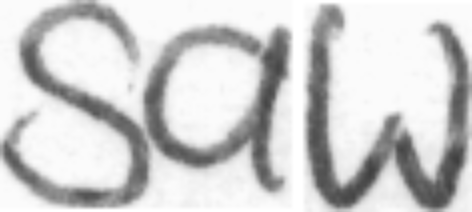

Image: Datasets/IAM_Words/words/c06/c06-047/c06-047-02-00.png, Label: produced, Prediction: produced, CER: 0.0


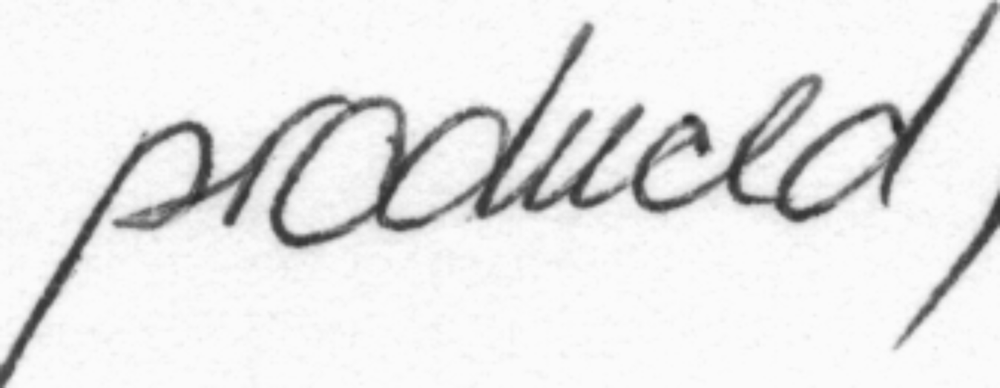

Image: Datasets/IAM_Words/words/e04/e04-114/e04-114-03-01.png, Label: and, Prediction: and, CER: 0.0


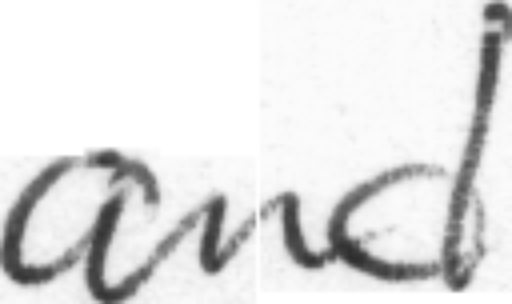

  0%|          | 16/9646 [00:00<04:20, 36.95it/s]

Image: Datasets/IAM_Words/words/g06/g06-042h/g06-042h-03-03.png, Label: to, Prediction: to, CER: 0.0


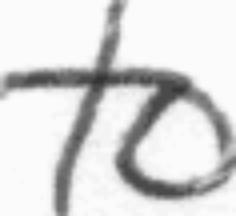

Image: Datasets/IAM_Words/words/g06/g06-018d/g06-018d-06-02.png, Label: but, Prediction: but, CER: 0.0


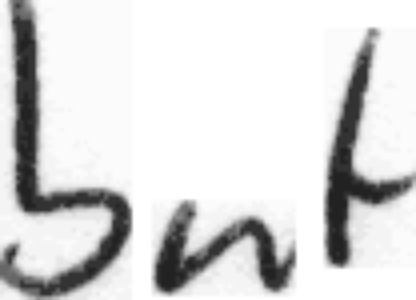

Image: Datasets/IAM_Words/words/e01/e01-107/e01-107-02-04.png, Label: you, Prediction: you, CER: 0.0


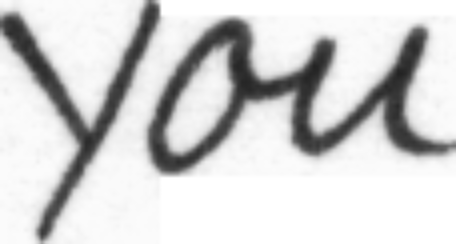

Image: Datasets/IAM_Words/words/g06/g06-037j/g06-037j-06-05.png, Label: alleviation, Prediction: alleviation, CER: 0.0


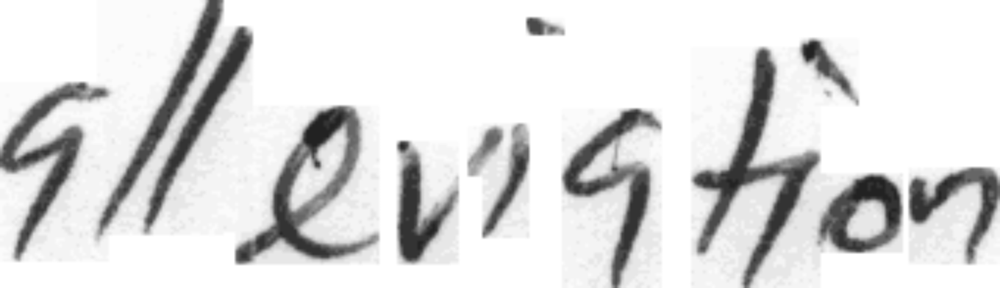

  0%|          | 20/9646 [00:00<04:37, 34.74it/s]

Image: Datasets/IAM_Words/words/c03/c03-084b/c03-084b-06-07.png, Label: destructive, Prediction: destrunctive, CER: 0.09090909090909091


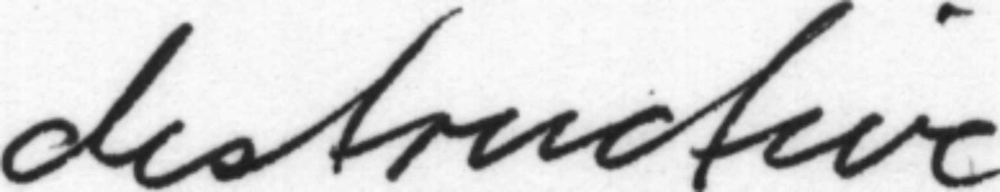

Image: Datasets/IAM_Words/words/f07/f07-042a/f07-042a-03-08.png, Label: fever, Prediction: tever, CER: 0.2


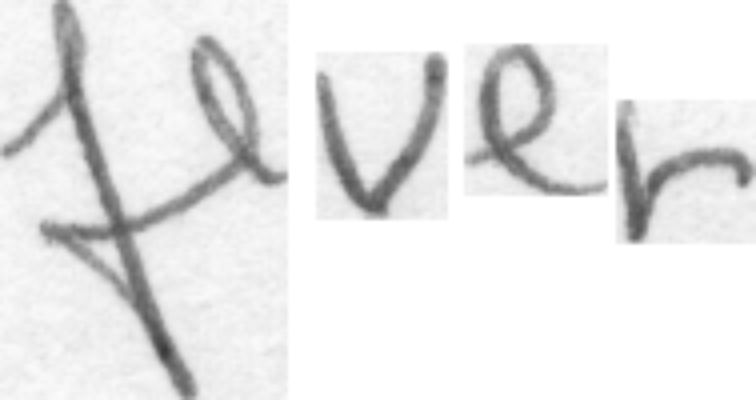

Image: Datasets/IAM_Words/words/g06/g06-037o/g06-037o-02-08.png, Label: ,, Prediction: ,, CER: 0.0


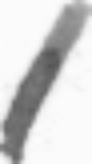

Image: Datasets/IAM_Words/words/k07/k07-134/k07-134-04-04.png, Label: ., Prediction: ., CER: 0.0


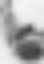

  0%|          | 24/9646 [00:00<06:43, 23.84it/s]

Image: Datasets/IAM_Words/words/f02/f02-020/f02-020-03-10.png, Label: of, Prediction: of, CER: 0.0


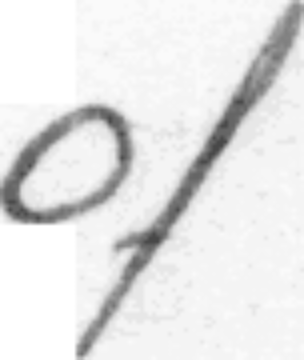

Image: Datasets/IAM_Words/words/c06/c06-087/c06-087-03-04.png, Label: is, Prediction: is, CER: 0.0


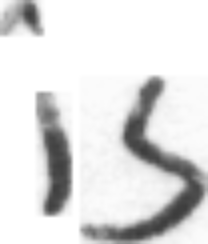

Image: Datasets/IAM_Words/words/k07/k07-122/k07-122-07-02.png, Label: full, Prediction: fule, CER: 0.25


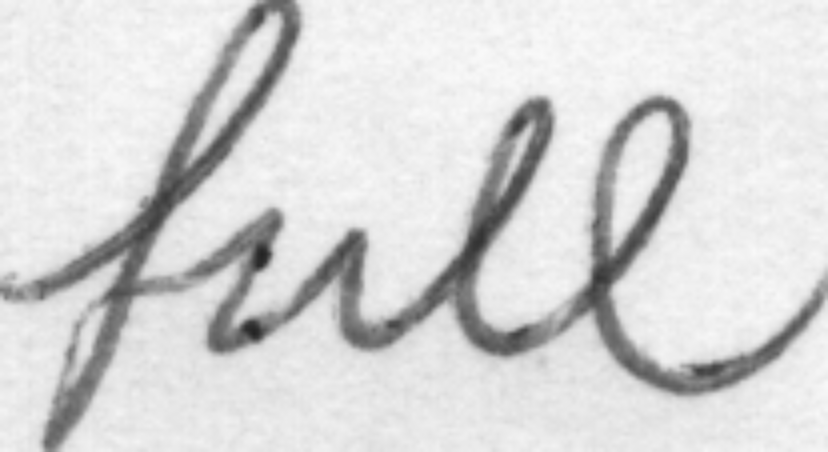

  0%|          | 27/9646 [00:01<08:31, 18.80it/s]

Image: Datasets/IAM_Words/words/n04/n04-213/n04-213-05-08.png, Label: a, Prediction: a, CER: 0.0


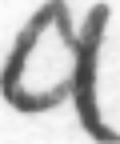

Image: Datasets/IAM_Words/words/n01/n01-031/n01-031-02-05.png, Label: ., Prediction: ., CER: 0.0


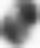

Image: Datasets/IAM_Words/words/b01/b01-004/b01-004-00-08.png, Label: be, Prediction: be, CER: 0.0


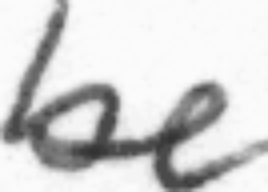

Image: Datasets/IAM_Words/words/d04/d04-089/d04-089-03-01.png, Label: learn, Prediction: beorn, CER: 0.4


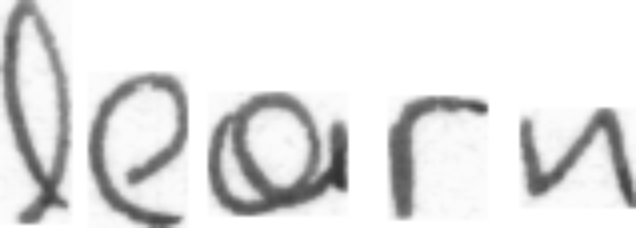

  0%|          | 31/9646 [00:01<07:45, 20.66it/s]

Image: Datasets/IAM_Words/words/h07/h07-060b/h07-060b-00-04.png, Label: provided, Prediction: provided, CER: 0.0


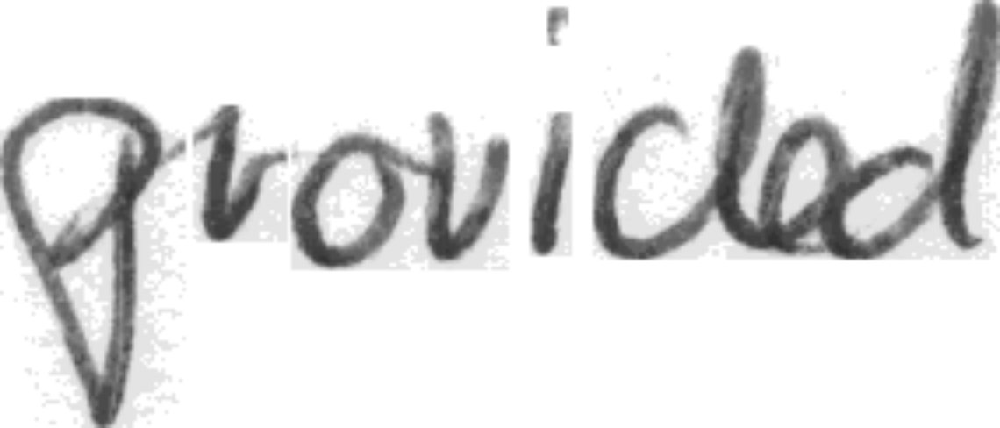

Image: Datasets/IAM_Words/words/g03/g03-040/g03-040-05-02.png, Label: ., Prediction: ., CER: 0.0


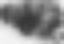

Image: Datasets/IAM_Words/words/f04/f04-049/f04-049-05-01.png, Label: the, Prediction: the, CER: 0.0


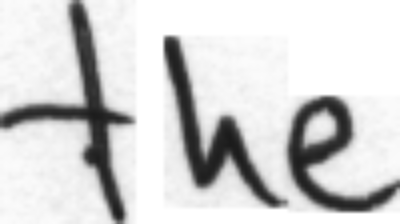

  0%|          | 34/9646 [00:01<09:28, 16.91it/s]

Image: Datasets/IAM_Words/words/h04/h04-071/h04-071-02-06.png, Label: it, Prediction: It, CER: 0.5


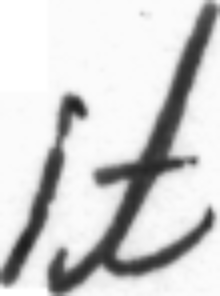

Image: Datasets/IAM_Words/words/f07/f07-006/f07-006-02-06.png, Label: thrifty, Prediction: thully, CER: 0.5714285714285714


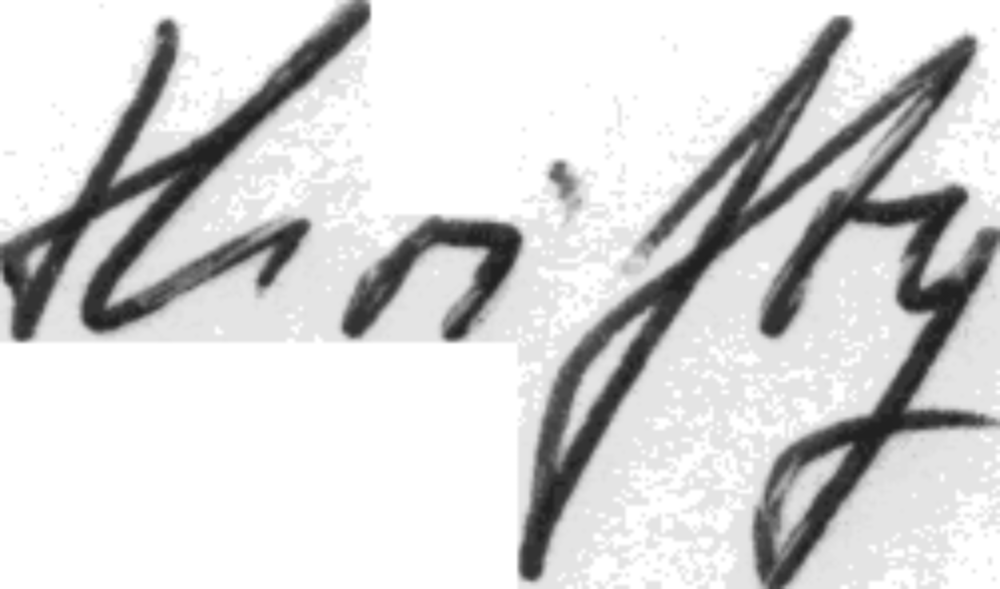

  0%|          | 36/9646 [00:01<12:48, 12.51it/s]

Image: Datasets/IAM_Words/words/c03/c03-003e/c03-003e-00-10.png, Label: con-, Prediction: con-, CER: 0.0


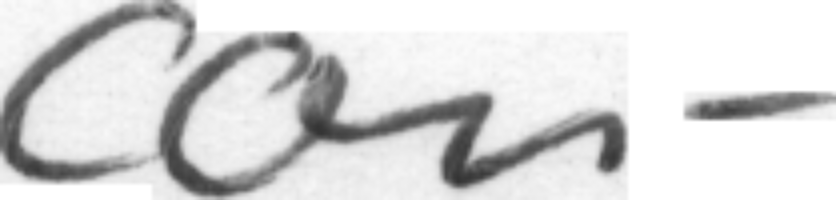

Image: Datasets/IAM_Words/words/a06/a06-057/a06-057-03-05.png, Label: ", Prediction: ", CER: 0.0


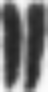

  0%|          | 38/9646 [00:01<11:58, 13.37it/s]

Image: Datasets/IAM_Words/words/m01/m01-060/m01-060-02-07.png, Label: thing, Prediction: thing, CER: 0.0


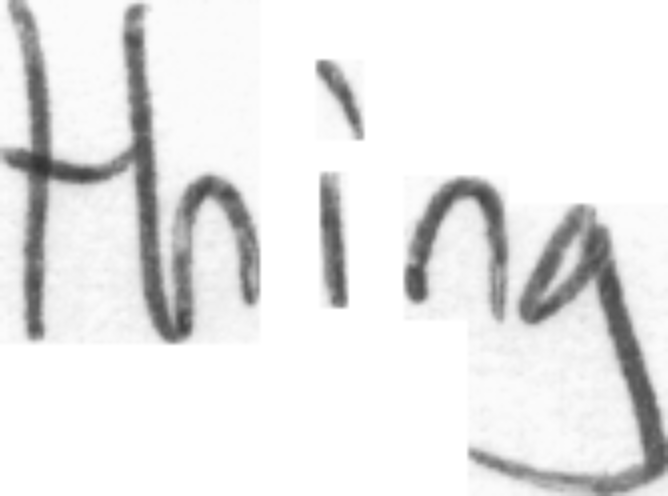

Image: Datasets/IAM_Words/words/c03/c03-016b/c03-016b-06-02.png, Label: ,, Prediction: ,, CER: 0.0


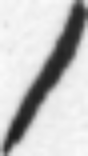

Image: Datasets/IAM_Words/words/b03/b03-104/b03-104-04-05.png, Label: British, Prediction: British, CER: 0.0


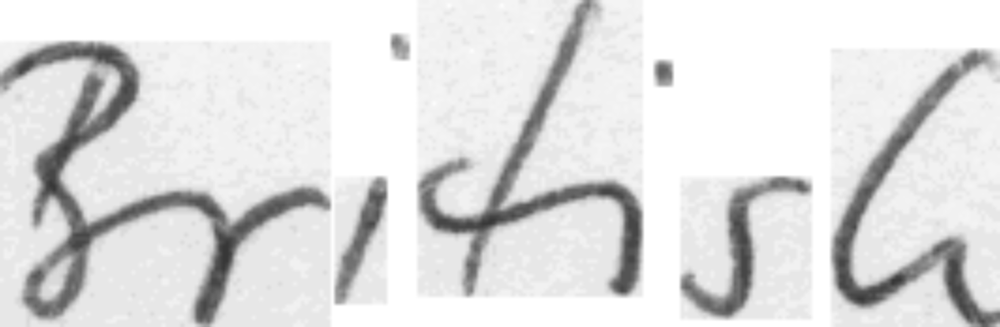

  0%|          | 41/9646 [00:02<10:05, 15.86it/s]

Image: Datasets/IAM_Words/words/c04/c04-039/c04-039-01-02.png, Label: had, Prediction: hed, CER: 0.3333333333333333


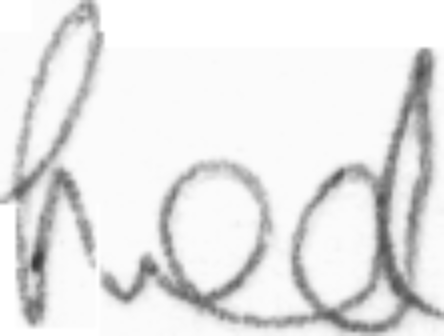

Image: Datasets/IAM_Words/words/g06/g06-047i/g06-047i-03-06.png, Label: unorthodox, Prediction: unorthodox, CER: 0.0


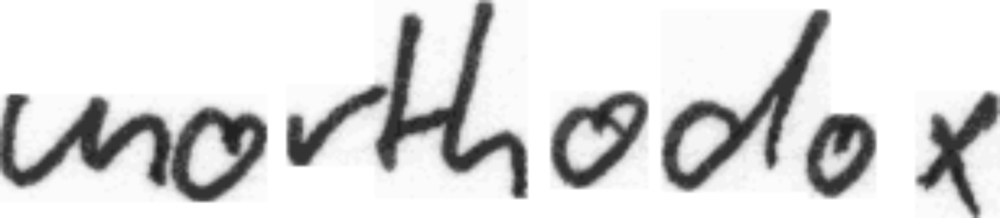

Image: Datasets/IAM_Words/words/j04/j04-024/j04-024-08-01.png, Label: milligrams, Prediction: ourigrons, CER: 0.6


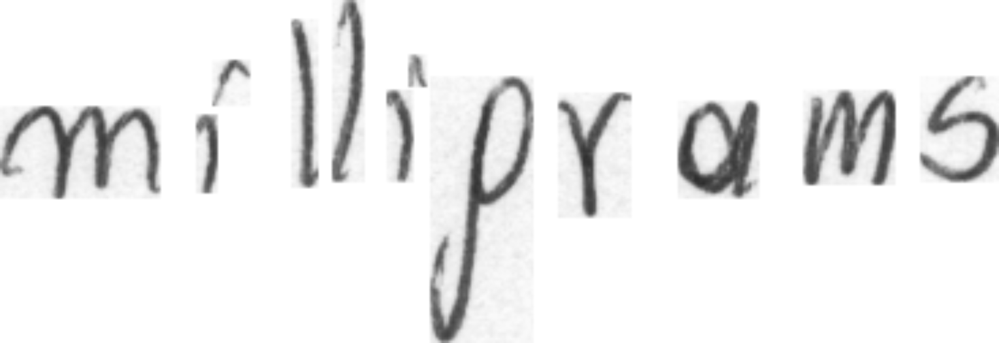

  0%|          | 44/9646 [00:02<09:19, 17.16it/s]

Image: Datasets/IAM_Words/words/c01/c01-009/c01-009-06-05.png, Label: ., Prediction: ., CER: 0.0


Image: Datasets/IAM_Words/words/b01/b01-113/b01-113-06-01.png, Label: tribal, Prediction: tild, CER: 0.6666666666666666


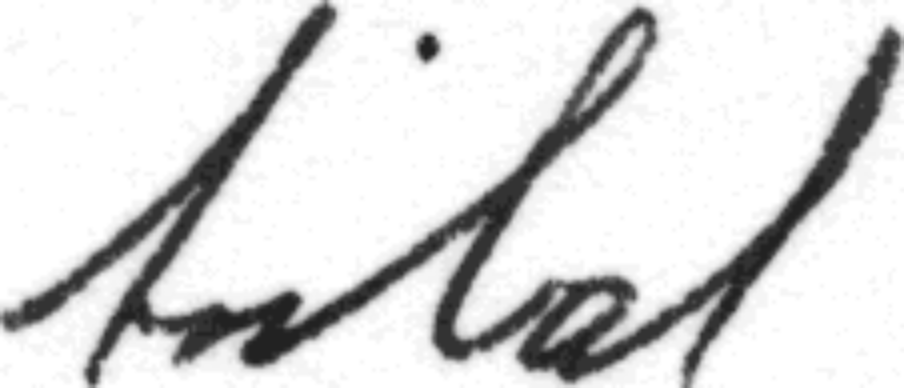

Image: Datasets/IAM_Words/words/a03/a03-023/a03-023-08-05.png, Label: the, Prediction: the, CER: 0.0


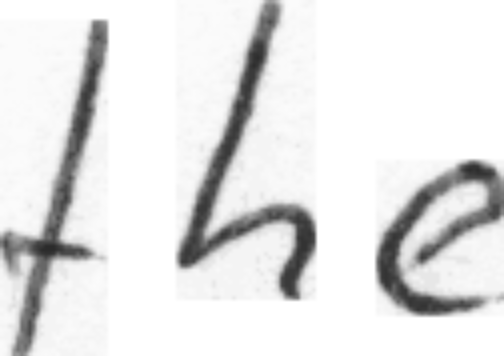

Image: Datasets/IAM_Words/words/g06/g06-037e/g06-037e-01-01.png, Label: may, Prediction: may, CER: 0.0


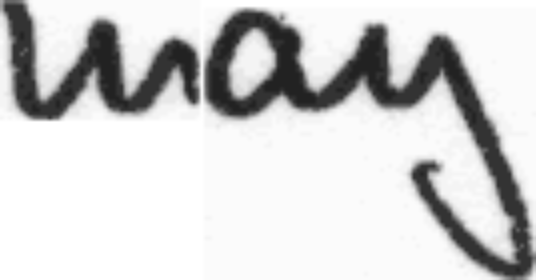

Image: Datasets/IAM_Words/words/n06/n06-163/n06-163-08-04.png, Label: all, Prediction: all, CER: 0.0


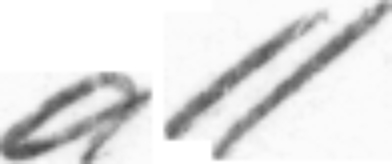

  1%|          | 49/9646 [00:02<06:47, 23.57it/s]

Image: Datasets/IAM_Words/words/h07/h07-080/h07-080-08-02.png, Label: towns, Prediction: towns, CER: 0.0


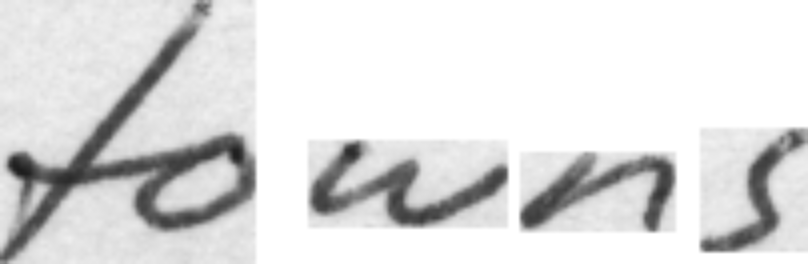

Image: Datasets/IAM_Words/words/f07/f07-096/f07-096-02-02.png, Label: ., Prediction: ., CER: 0.0


Image: Datasets/IAM_Words/words/f07/f07-039a/f07-039a-06-01.png, Label: of, Prediction: of, CER: 0.0


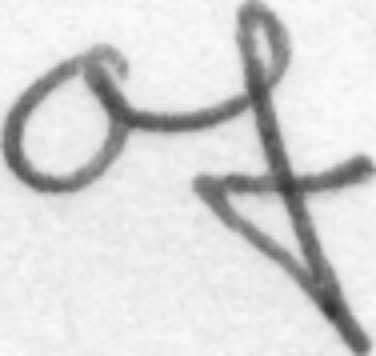

Image: Datasets/IAM_Words/words/g06/g06-037g/g06-037g-03-01.png, Label: he, Prediction: he, CER: 0.0


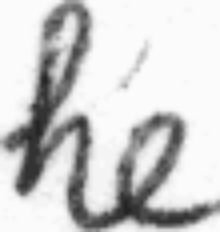

Image: Datasets/IAM_Words/words/f04/f04-016/f04-016-04-07.png, Label: some, Prediction: tome, CER: 0.25


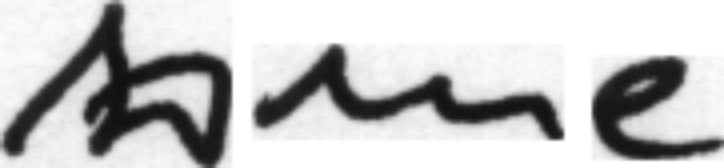

Image: Datasets/IAM_Words/words/m02/m02-095/m02-095-06-04.png, Label: become, Prediction: Become, CER: 0.16666666666666666


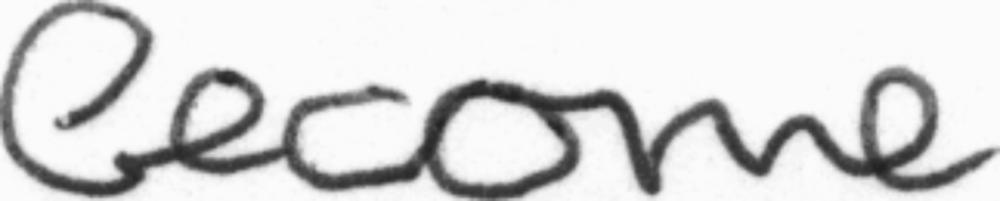

  1%|          | 55/9646 [00:02<05:36, 28.53it/s]

Image: Datasets/IAM_Words/words/a01/a01-026/a01-026-05-04.png, Label: and, Prediction: and, CER: 0.0


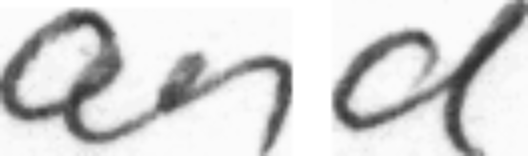

Image: Datasets/IAM_Words/words/p03/p03-004/p03-004-08-05.png, Label: of, Prediction: of, CER: 0.0


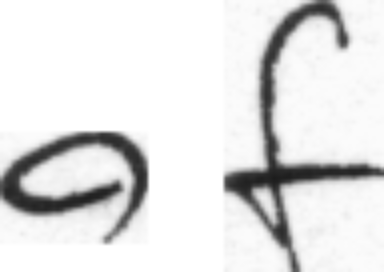

Image: Datasets/IAM_Words/words/c02/c02-022/c02-022-02-00.png, Label: poor, Prediction: poor, CER: 0.0


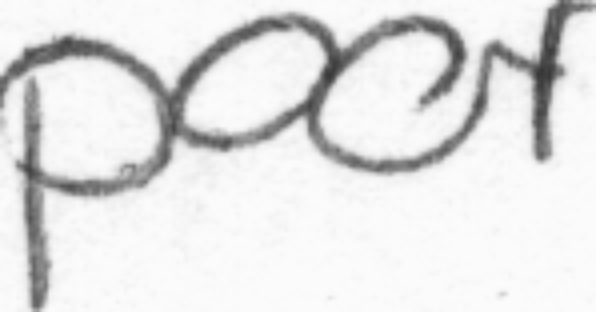

Image: Datasets/IAM_Words/words/c03/c03-096b/c03-096b-07-00.png, Label: like, Prediction: like, CER: 0.0


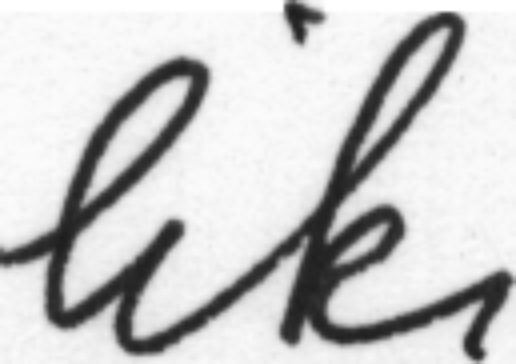

  1%|          | 59/9646 [00:02<05:24, 29.56it/s]

Image: Datasets/IAM_Words/words/f02/f02-040/f02-040-06-05.png, Label: Department, Prediction: Depeartoment, CER: 0.2


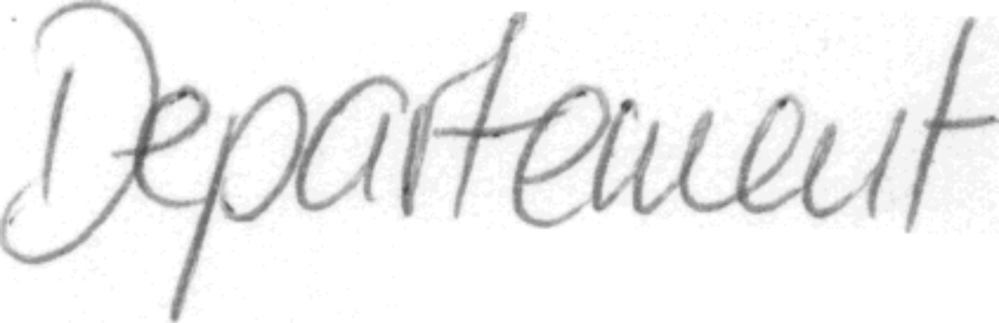

Image: Datasets/IAM_Words/words/f07/f07-032a/f07-032a-03-07.png, Label: the, Prediction: the, CER: 0.0


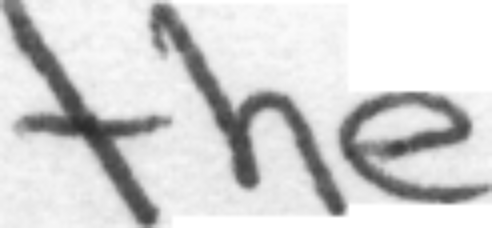

Image: Datasets/IAM_Words/words/g01/g01-031/g01-031-09-03.png, Label: always, Prediction: alwoys, CER: 0.16666666666666666


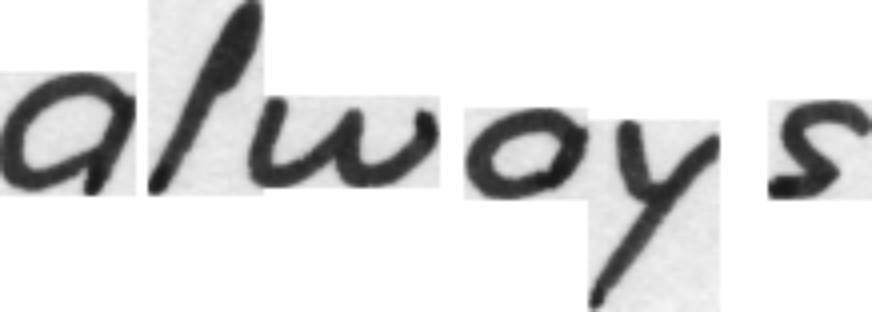

Image: Datasets/IAM_Words/words/r02/r02-065/r02-065-07-00.png, Label: alone, Prediction: aone, CER: 0.2


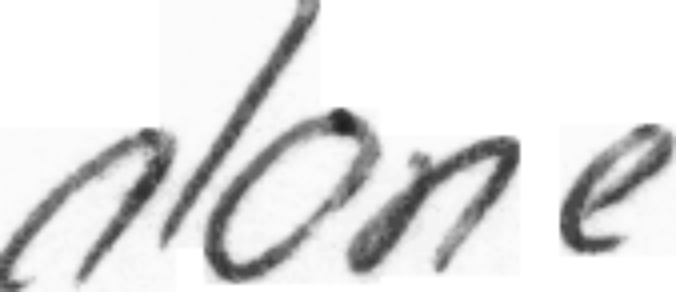

  1%|          | 63/9646 [00:02<05:58, 26.76it/s]

Image: Datasets/IAM_Words/words/k04/k04-163/k04-163-07-00.png, Label: were, Prediction: wele, CER: 0.25


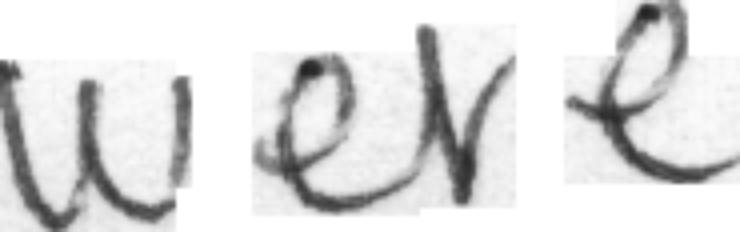

Image: Datasets/IAM_Words/words/n01/n01-031/n01-031-05-00.png, Label: scanner, Prediction: seatmmer, CER: 0.5714285714285714


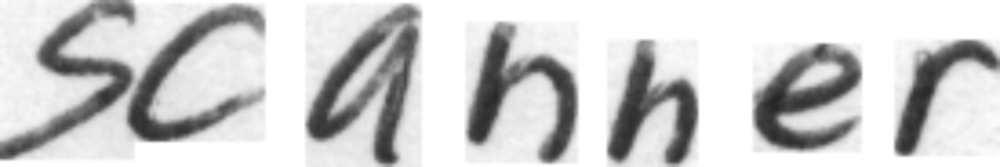

Image: Datasets/IAM_Words/words/f07/f07-092b/f07-092b-01-03.png, Label: said, Prediction: aid, CER: 0.25


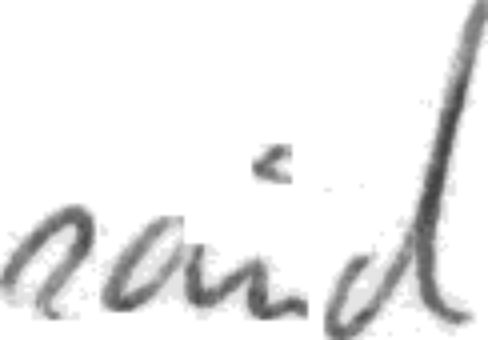

Image: Datasets/IAM_Words/words/d06/d06-020/d06-020-02-09.png, Label: the, Prediction: the, CER: 0.0


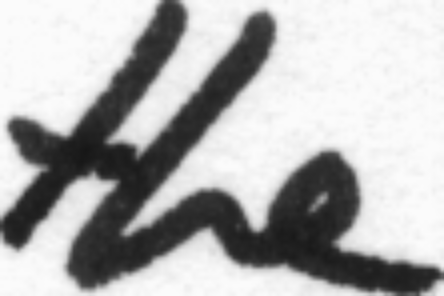

Image: Datasets/IAM_Words/words/b05/b05-058/b05-058-00-12.png, Label: ., Prediction: ., CER: 0.0


  1%|          | 68/9646 [00:02<05:05, 31.39it/s]

Image: Datasets/IAM_Words/words/a06/a06-152/a06-152-05-05.png, Label: Mr., Prediction: Mr., CER: 0.0


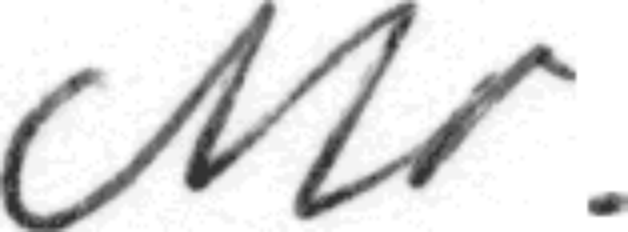

Image: Datasets/IAM_Words/words/n01/n01-020/n01-020-08-01.png, Label: across, Prediction: wems, CER: 0.8333333333333334


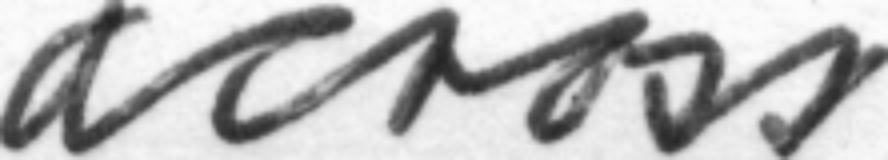

Image: Datasets/IAM_Words/words/d04/d04-032/d04-032-10-05.png, Label: the, Prediction: the, CER: 0.0


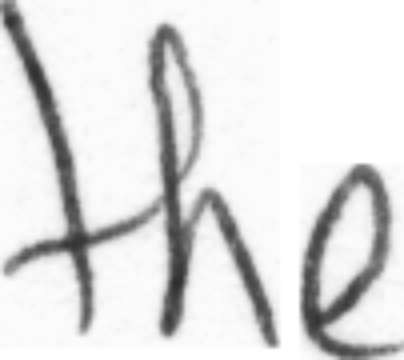

Image: Datasets/IAM_Words/words/l01/l01-129/l01-129-05-01.png, Label: home, Prediction: home, CER: 0.0


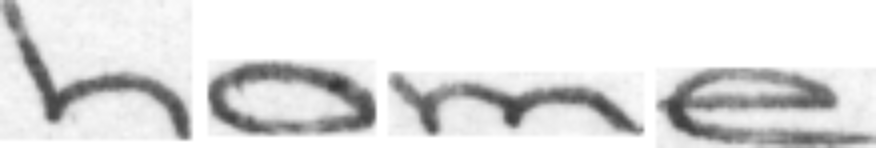

Image: Datasets/IAM_Words/words/b01/b01-023/b01-023-05-05.png, Label: to, Prediction: to, CER: 0.0


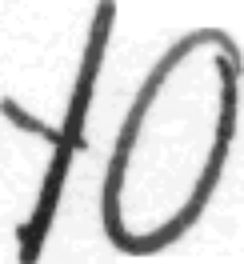

  1%|          | 73/9646 [00:02<04:32, 35.07it/s]

Image: Datasets/IAM_Words/words/d01/d01-118/d01-118-06-09.png, Label: on, Prediction: on, CER: 0.0


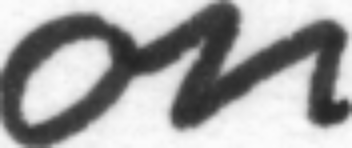

Image: Datasets/IAM_Words/words/f01/f01-075/f01-075-08-08.png, Label: and, Prediction: and, CER: 0.0


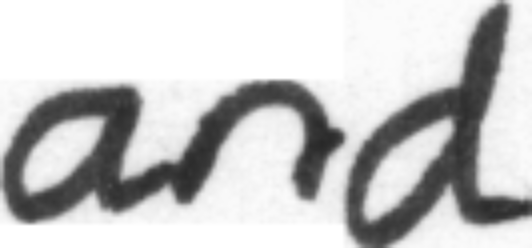

Image: Datasets/IAM_Words/words/a02/a02-098/a02-098-00-00.png, Label: Its, Prediction: ls, CER: 0.6666666666666666


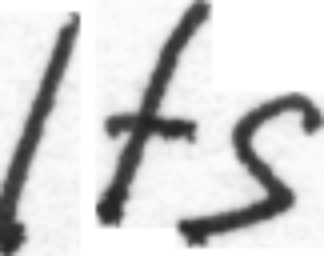

Image: Datasets/IAM_Words/words/m03/m03-020/m03-020-03-01.png, Label: munching, Prediction: muckhing, CER: 0.25


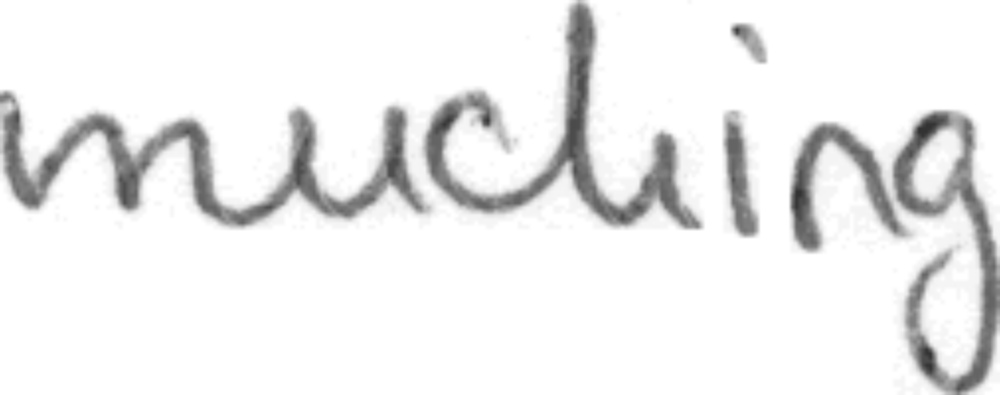

Image: Datasets/IAM_Words/words/a06/a06-070/a06-070-01-04.png, Label: He, Prediction: He, CER: 0.0


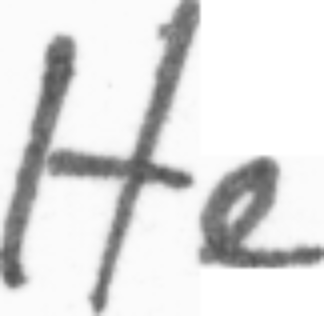

  1%|          | 78/9646 [00:03<04:12, 37.88it/s]

Image: Datasets/IAM_Words/words/b06/b06-079/b06-079-08-06.png, Label: placing, Prediction: sing, CER: 0.5714285714285714


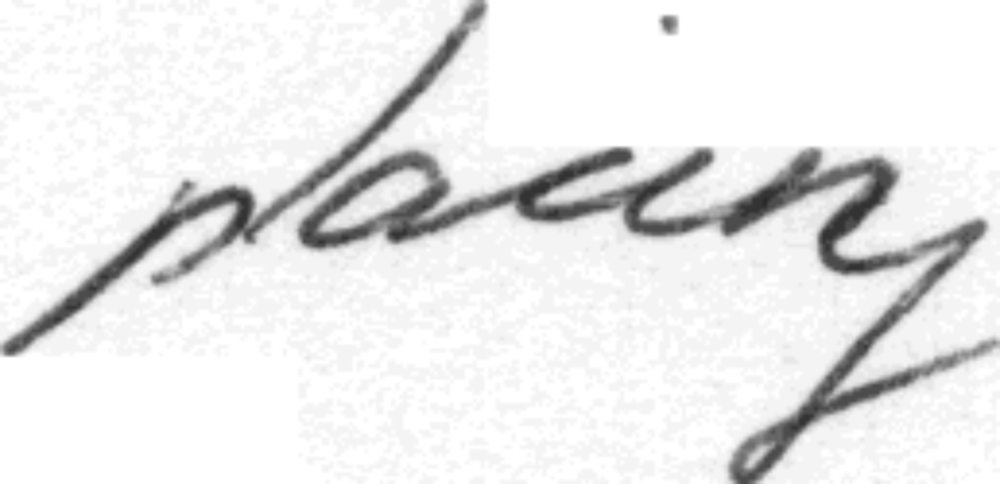

Image: Datasets/IAM_Words/words/h02/h02-037/h02-037-04-05.png, Label: heroin, Prediction: heron, CER: 0.16666666666666666


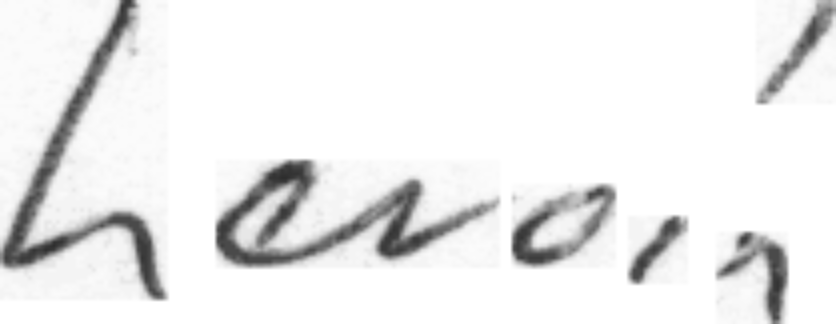

Image: Datasets/IAM_Words/words/m01/m01-100/m01-100-04-05.png, Label: as, Prediction: as, CER: 0.0


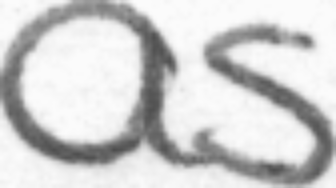

Image: Datasets/IAM_Words/words/m02/m02-066/m02-066-01-08.png, Label: storm, Prediction: strom, CER: 0.4


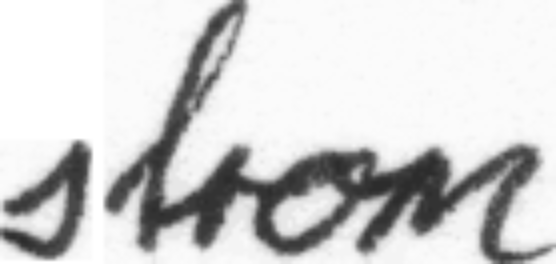

Image: Datasets/IAM_Words/words/c03/c03-087e/c03-087e-00-00.png, Label: It, Prediction: It, CER: 0.0


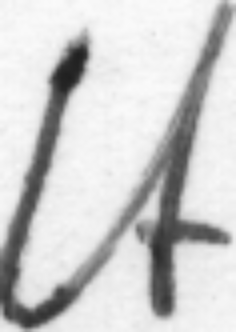

  1%|          | 83/9646 [00:03<04:20, 36.69it/s]

Image: Datasets/IAM_Words/words/r03/r03-084/r03-084-08-03.png, Label: ,, Prediction: ,, CER: 0.0


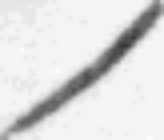

Image: Datasets/IAM_Words/words/m03/m03-114/m03-114-08-05.png, Label: us, Prediction: od, CER: 1.0


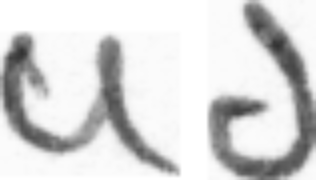

Image: Datasets/IAM_Words/words/g01/g01-034/g01-034-05-03.png, Label: even, Prediction: even, CER: 0.0


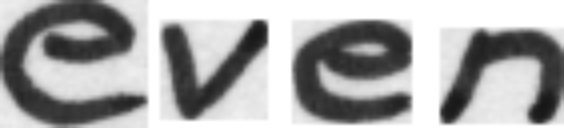

Image: Datasets/IAM_Words/words/h07/h07-051b/h07-051b-07-05.png, Label: ", Prediction: ", CER: 0.0


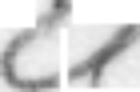

Image: Datasets/IAM_Words/words/l07/l07-187/l07-187-05-03.png, Label: in, Prediction: in, CER: 0.0


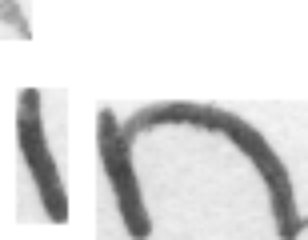

Image: Datasets/IAM_Words/words/d04/d04-050/d04-050-00-04.png, Label: in, Prediction: In, CER: 0.5


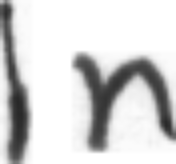

Image: Datasets/IAM_Words/words/a01/a01-077u/a01-077u-05-06.png, Label: ., Prediction: ., CER: 0.0


Image: Datasets/IAM_Words/words/b01/b01-079/b01-079-09-08.png, Label: new, Prediction: new, CER: 0.0


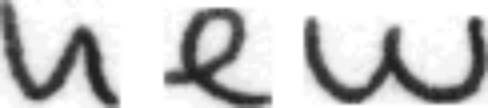

Image: Datasets/IAM_Words/words/r06/r06-007/r06-007-06-05.png, Label: and, Prediction: and, CER: 0.0


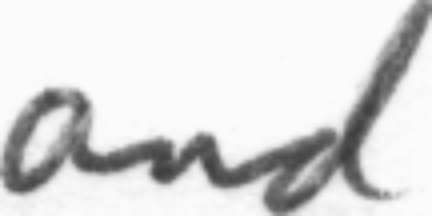

Image: Datasets/IAM_Words/words/b05/b05-032/b05-032-05-01.png, Label: the, Prediction: the, CER: 0.0


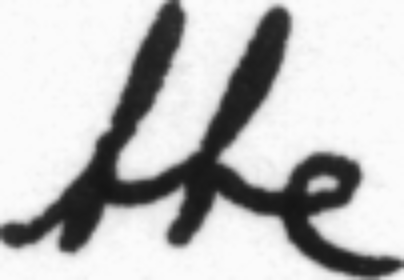

  1%|          | 93/9646 [00:03<03:09, 50.30it/s]

Image: Datasets/IAM_Words/words/p02/p02-081/p02-081-04-00.png, Label: Gavin, Prediction: gauin, CER: 0.4


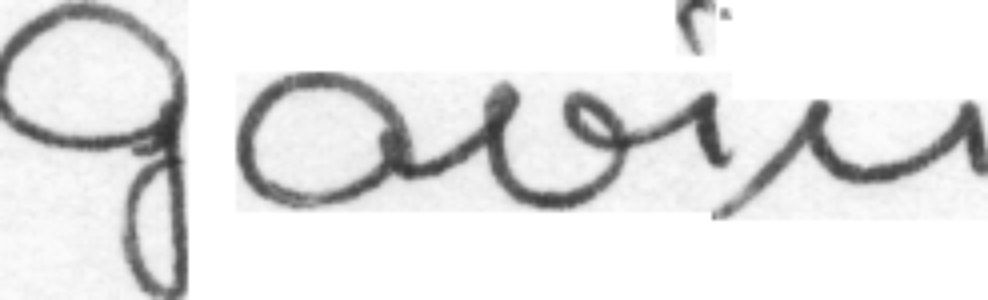

Image: Datasets/IAM_Words/words/c06/c06-076/c06-076-01-07.png, Label: witnessed, Prediction: wistresed, CER: 0.3333333333333333


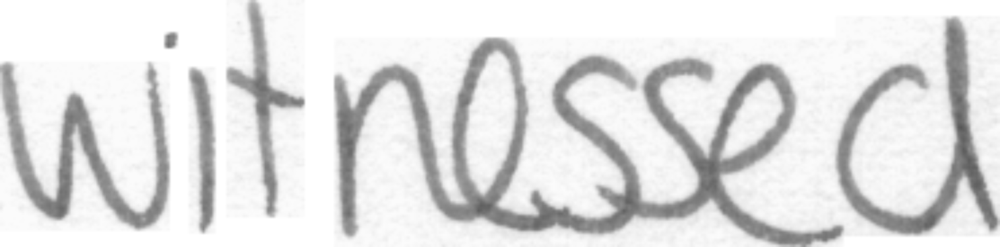

Image: Datasets/IAM_Words/words/b04/b04-162/b04-162-00-07.png, Label: Rhodesia, Prediction: Rhodesia, CER: 0.0


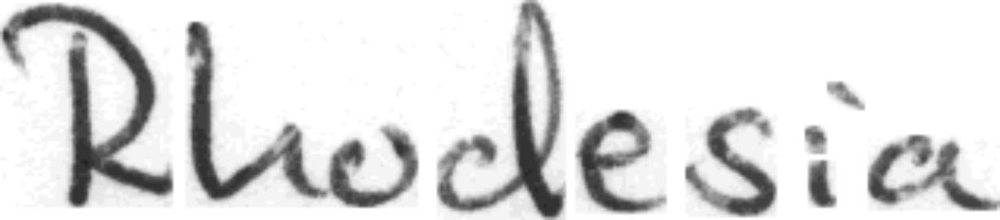

Image: Datasets/IAM_Words/words/d06/d06-020/d06-020-02-08.png, Label: all, Prediction: all, CER: 0.0


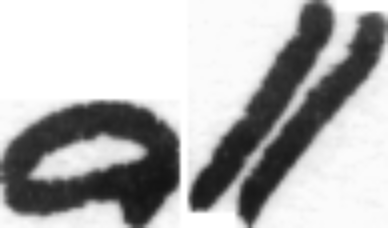

Image: Datasets/IAM_Words/words/h07/h07-080/h07-080-00-03.png, Label: that, Prediction: that, CER: 0.0


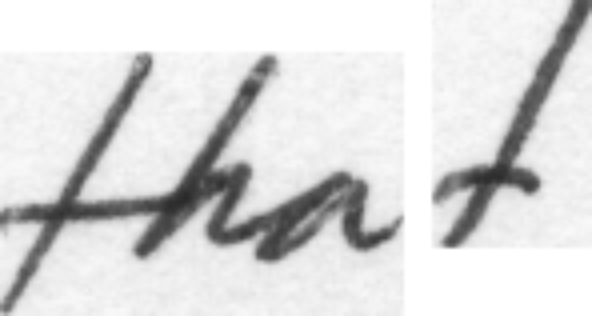

Image: Datasets/IAM_Words/words/g06/g06-093/g06-093-03-02.png, Label: that, Prediction: that, CER: 0.0


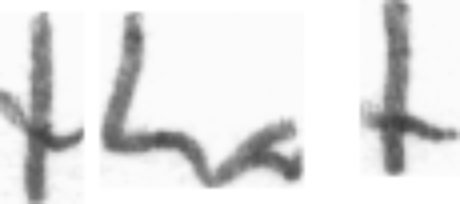

  1%|          | 99/9646 [00:03<03:57, 40.27it/s]

Image: Datasets/IAM_Words/words/e01/e01-092/e01-092-06-05.png, Label: ,, Prediction: ,, CER: 0.0


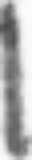

Image: Datasets/IAM_Words/words/d04/d04-096/d04-096-04-07.png, Label: And, Prediction: Ant, CER: 0.3333333333333333


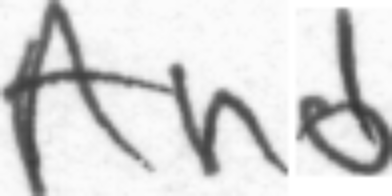

Image: Datasets/IAM_Words/words/h01/h01-004/h01-004-05-01.png, Label: the, Prediction: the, CER: 0.0


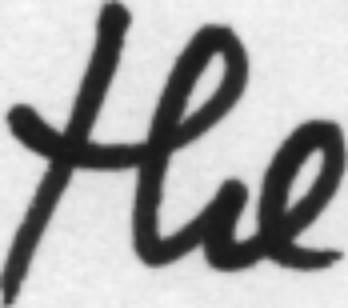

Image: Datasets/IAM_Words/words/b05/b05-083/b05-083-03-01.png, Label: Eichmann, Prediction: Eidmarn, CER: 0.375


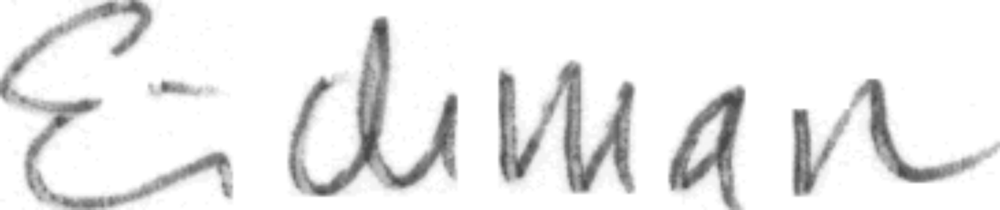

Image: Datasets/IAM_Words/words/h04/h04-000/h04-000-01-02.png, Label: higher, Prediction: higher, CER: 0.0


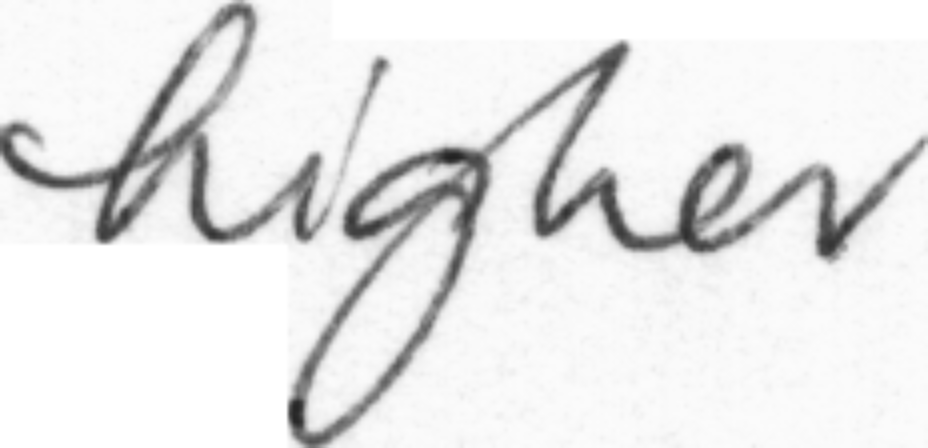

  1%|          | 104/9646 [00:03<04:09, 38.29it/s]

Image: Datasets/IAM_Words/words/d06/d06-050/d06-050-01-12.png, Label: an, Prediction: an, CER: 0.0


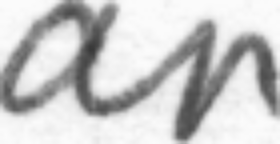

Image: Datasets/IAM_Words/words/b01/b01-053/b01-053-02-02.png, Label: giving, Prediction: giving, CER: 0.0


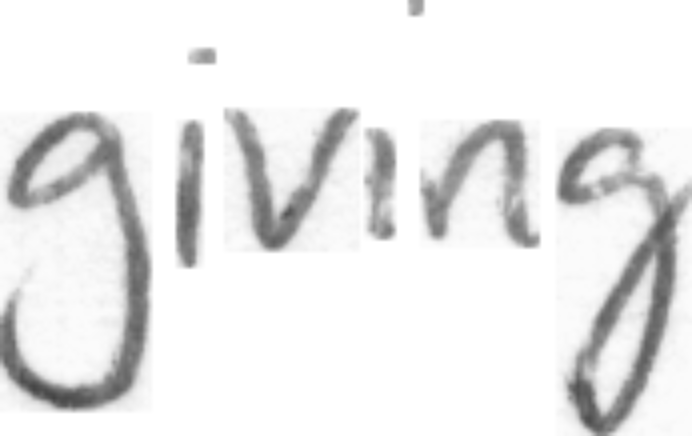

Image: Datasets/IAM_Words/words/n04/n04-000/n04-000-00-04.png, Label: ., Prediction: ., CER: 0.0


Image: Datasets/IAM_Words/words/h07/h07-066a/h07-066a-00-06.png, Label: Labour, Prediction: Labour, CER: 0.0


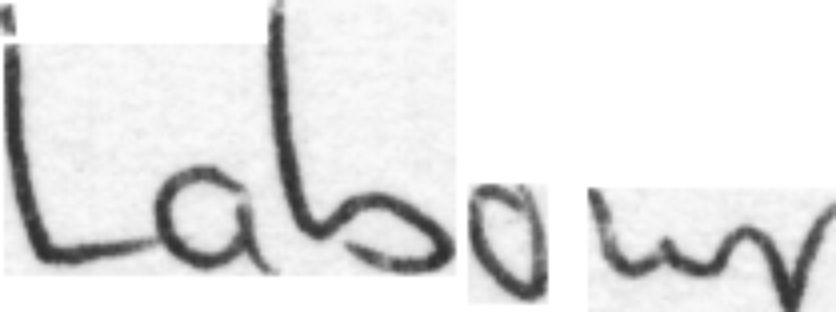

Image: Datasets/IAM_Words/words/f04/f04-032/f04-032-02-01.png, Label: had, Prediction: has, CER: 0.3333333333333333


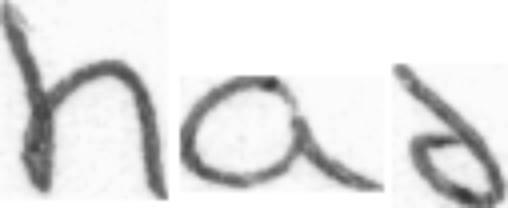

  1%|          | 109/9646 [00:03<03:54, 40.67it/s]

Image: Datasets/IAM_Words/words/a04/a04-089/a04-089-09-04.png, Label: being, Prediction: being, CER: 0.0


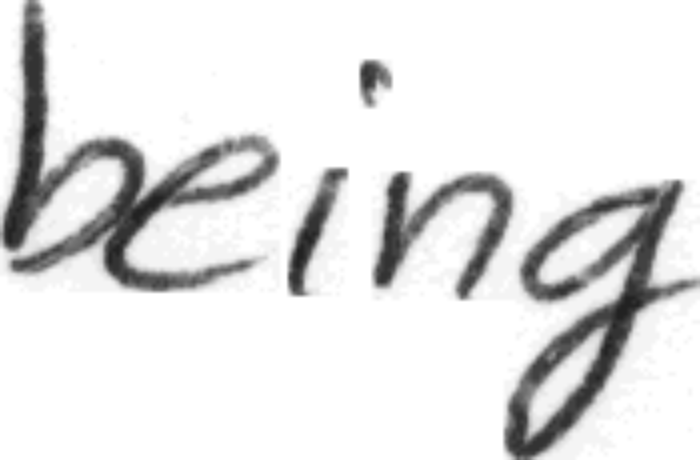

Image: Datasets/IAM_Words/words/c04/c04-023/c04-023-01-03.png, Label: sinister, Prediction: sinister, CER: 0.0


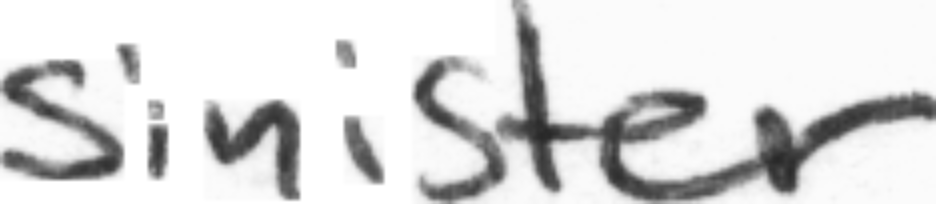

Image: Datasets/IAM_Words/words/r03/r03-110/r03-110-05-01.png, Label: write, Prediction: write, CER: 0.0


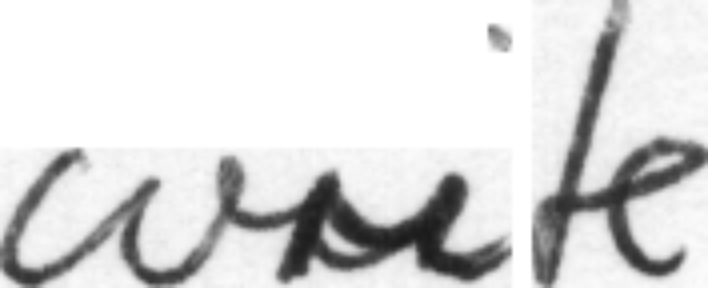

Image: Datasets/IAM_Words/words/m01/m01-100/m01-100-02-06.png, Label: anxious, Prediction: aurious, CER: 0.2857142857142857


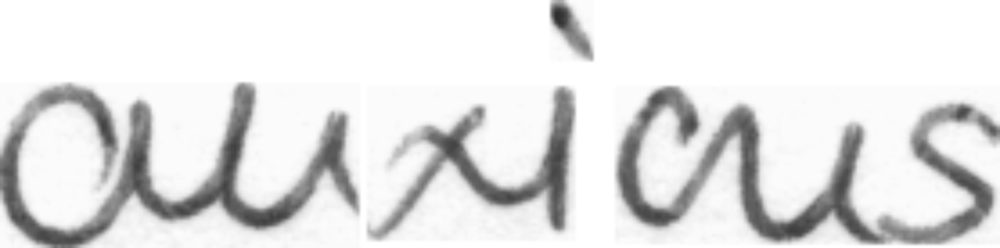

Image: Datasets/IAM_Words/words/h07/h07-025/h07-025-06-04.png, Label: on, Prediction: on, CER: 0.0


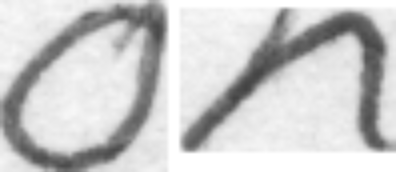

  1%|          | 114/9646 [00:03<04:05, 38.75it/s]

Image: Datasets/IAM_Words/words/j04/j04-046/j04-046-01-05.png, Label: the, Prediction: the, CER: 0.0


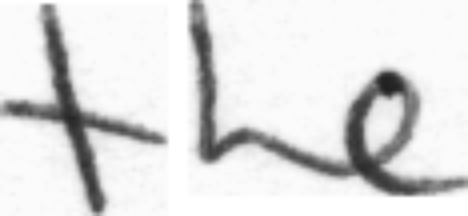

Image: Datasets/IAM_Words/words/d06/d06-046/d06-046-01-04.png, Label: There, Prediction: There, CER: 0.0


In [ ]:
import cv2
import typing
import numpy as np

from mltu.inferenceModel import OnnxInferenceModel
from mltu.utils.text_utils import ctc_decoder, get_cer
# Import cv2_imshow
from google.colab.patches import cv2_imshow

class ImageToWordModel(OnnxInferenceModel):
    def __init__(self, char_list: typing.Union[str, list], *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.char_list = char_list

    def predict(self, image: np.ndarray):
        image = cv2.resize(image, self.input_shapes[0][1:3][::-1])

        image_pred = np.expand_dims(image, axis=0).astype(np.float32)

        preds = self.model.run(self.output_names, {self.input_names[0]: image_pred})[0]

        text = ctc_decoder(preds, self.char_list)[0]

        return text

if __name__ == "__main__":
    import pandas as pd
    from tqdm import tqdm
    from mltu.configs import BaseModelConfigs

    configs = BaseModelConfigs.load("/content/trained_model/configs.yaml")

    model = ImageToWordModel(model_path=configs.model_path, char_list=configs.vocab)

    df = pd.read_csv("/content/trained_model/val.csv").values.tolist()

    accum_cer = []
    for image_path, label in tqdm(df):
        image = cv2.imread(image_path.replace("\\", "/"))

        prediction_text = model.predict(image)

        cer = get_cer(prediction_text, label)
        print(f"Image: {image_path}, Label: {label}, Prediction: {prediction_text}, CER: {cer}")

        accum_cer.append(cer)

        # resize by 4x
        image = cv2.resize(image, (image.shape[1] * 4, image.shape[0] * 4))
        # Replace cv2.imshow with cv2_imshow
        cv2_imshow(image)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

    print(f"Average CER: {np.average(accum_cer)}")

In [40]:
from google.colab.patches import cv2_imshow

For example, here we download and display a PNG image of the Colab logo:

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  4534  100  4534    0     0  41991      0 --:--:-- --:--:-- --:--:-- 41981


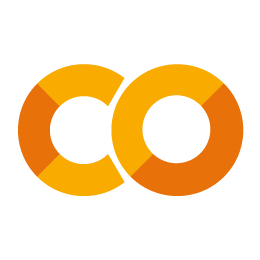

In [42]:
!curl -o logo.png https://colab.research.google.com/img/colab_favicon_256px.png
import cv2
img = cv2.imread('logo.png', cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

In [25]:
!pip install tf2onnx

In [26]:
model2onnx = Model2onnx(f"{configs.model_path}/model.onnx") # Modified to save as .onnx